In [69]:
import pandas as pd
import numpy
import re
import matplotlib.pyplot as plt 

In [74]:
df = pd.read_csv("/Users/tyl17/Documents/AR_combined_dataset_230918.csv")
#print(df.head())
list(df.columns)

KeyError: '_oh'

In [23]:
date_unique = df.ca_collection_date.unique()
print(date_unique)
len(date_unique)

['7/3/17' '8/28/17' '8/31/17' ... '6/17/23' '6/18/23' '6/20/23']


1021

In [24]:
state_unique = df.state.unique()
print(state_unique)
len(state_unique)

['CT' 'MA' 'NY' 'NJ' 'NH' 'RI' 'VT' 'ME']


8

In [25]:
county_unique = df.county.unique()
print(county_unique)
len(county_unique)

[nan 'Albany County' 'Westchester County' 'Suffolk County' 'Nassau County'
 'Onondaga County' 'Greene County' 'Jefferson County' 'Bronx County'
 'Erie County' 'Columbia County' 'New York County' 'Kings County'
 'Monroe County' 'Schenectady County' 'Rensselaer County'
 'Richmond County' 'Genesee County' 'Queens County' 'Montgomery County'
 'Delaware County' 'Washington County' 'Ulster County' 'Dutchess County'
 'Orange County' 'Lewis County' 'Broome County' 'Saratoga County'
 'Cattaraugus County' 'Oswego County' 'Rockland County' 'Otsego County'
 'Warren County' 'Steuben County' 'Putnam County' 'Madison County'
 'Allegany County' 'Cayuga County' 'Chemung County' 'Clinton County'
 'Cortland County' 'Schoharie County' 'Fulton County' 'Essex County'
 'St. Lawrence County' 'Orleans County' 'Wayne County' 'Tompkins County'
 'Schuyler County' 'Niagara County' 'Sullivan County' 'Herkimer County']


52

In [26]:
css_unique = df.css_organism.unique()
print(css_unique)
len(css_unique)

['Acinetobacter baumannii' 'Pseudomonas aeruginosa'
 'Klebsiella pneumoniae' 'Escherichia coli' 'Citrobacter freundii'
 'Citrobacter amalonaticus' 'Acinetobacter calcoaceticus'
 'Enterobacter cloacae' 'Klebsiella variicola' 'Proteus mirabilis'
 'Enterobacter cloacae complex' 'Proteus vulgaris group'
 'Providencia rettgeri' 'Serratia marcescens' 'Klebsiella oxytoca'
 'Citrobacter farmeri' 'Pseudomonas putida group'
 'Raoultella ornithinolytica' 'Raoultella species'
 'Enterobacter bugandensis' 'Klebsiella aerogenes' 'Pseudomonas putida'
 'Citrobacter koseri' 'Providencia stuartii'
 'Citrobacter freundii complex' 'Acinetobacter radioresistens'
 'Pseudomonas nitroreducens' 'Pseudomonas fulva' 'Morganella morganii'
 'Raoultella planticola' 'Acinetobacter seifertii'
 'Enterobacter hormaechei' 'Pluralibacter gergoviae']


33

In [27]:
dict = {}
Org_Set = pd.DataFrame()

for a in css_unique:
    b = list()
    for index, row in df.iterrows():
        if a ==row['css_organism']:
            #print(a,row['css_organism'])
            #print(row)
            b.append(list(row))
            dict[a] = b

dict

{'Acinetobacter baumannii': [['IDR1700036075-01-00',
   '7/3/17',
   '2.0.0',
   'Acinetobacter baumannii',
   'abaumannii_2',
   '2',
   '195',
   '2023HL-00061',
   'SRR23455315',
   "ant(3'')-IIa,aph(3'')-Ib,aph(3')-VIa,aph(6)-Id,armA,blaADC-73,blaOXA-23,blaOXA-66,mph(E),msr(E),tet(B)",
   'CT',
   nan,
   'Clinical Isolates',
   2017,
   '2017:7-12',
   '2/195',
   'Acinetobacter baumannii',
   nan,
   nan,
   nan,
   'blaOXA-23',
   nan,
   nan,
   'blaOXA-23',
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   'blaOXA-23'],
  ['IDR1700046690-01-00',
   '8/31/17',
   '2.0.0',
   'Acinetobacter baumannii',
   'abaumannii_2',
   '49',
   '128',
   '2023HL-00062',
   'SRR23455314',
   "ant(3'')-IIa,blaADC-117,blaKPC-2,blaOXA-98",
   'CT',
   nan,
   'Clinical Isolates',
   2017,
   '2017:7-12',
   '49/128',
   'Acinetobacter baumannii',
   'blaKPC-2',
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   nan,
   'blaKPC'],
  ['IDR1700049245-01-00'

In [29]:
Acinetobacter_baumannii = pd.DataFrame(dict['Acinetobacter baumannii'])
Acinetobacter_baumannii.columns =list(df.columns)



In [30]:
list(df.columns)

['id',
 'ca_collection_date',
 'Pipeline.Version',
 'css_organism',
 'MLST.Typing.Scheme',
 'ST',
 'Secondary.ST',
 'wgs_id',
 'sra_id',
 'Gene',
 'state',
 'county',
 'colonization_screen',
 'year',
 'time_period',
 'ST_Comb',
 'species_category',
 'kpc',
 'ndm',
 'oxa48',
 'oxa23',
 'oxa24_40',
 'oxa58',
 'oxa_comb',
 'vim',
 'imp',
 'mcr',
 'imi',
 'sim',
 'spm',
 'ar_gene']

In [31]:
#This for loop turns seperates out each organism into their each individual dataframe saved under the variable name of the organism
#Example: all rows with organism Acinetobacter baumannii are saved as a dataframe in a variable Acinetobacter_baumannii
df2= pd.DataFrame()
Freq = []
for i in css_unique:
    df2= pd.DataFrame(dict[i])
    df2.columns = list(df.columns)
     #print(df2.head())
    variable_name = re.sub(' ','_',i)
    variable_value = df2
    globals()[variable_name] = variable_value
    #print(i)
    #print(variable_name)
    Freq.append(len(df2))

print(Freq)

[806, 255, 666, 261, 15, 3, 68, 11, 5, 14, 84, 1, 8, 4, 20, 2, 2, 2, 1, 2, 3, 2, 3, 1, 5, 2, 1, 1, 1, 3, 1, 22, 1]


In [32]:
len(css_unique)

33

In [33]:
AR_pop = {}
for i in css_unique:
    variable_name = re.sub(' ','_',i)
    print(variable_name)
    shape = eval(variable_name)
    print(shape.shape)
    print(len(shape))
    AR_pop[variable_name]=len(shape)


Acinetobacter_baumannii
(806, 31)
806
Pseudomonas_aeruginosa
(255, 31)
255
Klebsiella_pneumoniae
(666, 31)
666
Escherichia_coli
(261, 31)
261
Citrobacter_freundii
(15, 31)
15
Citrobacter_amalonaticus
(3, 31)
3
Acinetobacter_calcoaceticus
(68, 31)
68
Enterobacter_cloacae
(11, 31)
11
Klebsiella_variicola
(5, 31)
5
Proteus_mirabilis
(14, 31)
14
Enterobacter_cloacae_complex
(84, 31)
84
Proteus_vulgaris_group
(1, 31)
1
Providencia_rettgeri
(8, 31)
8
Serratia_marcescens
(4, 31)
4
Klebsiella_oxytoca
(20, 31)
20
Citrobacter_farmeri
(2, 31)
2
Pseudomonas_putida_group
(2, 31)
2
Raoultella_ornithinolytica
(2, 31)
2
Raoultella_species
(1, 31)
1
Enterobacter_bugandensis
(2, 31)
2
Klebsiella_aerogenes
(3, 31)
3
Pseudomonas_putida
(2, 31)
2
Citrobacter_koseri
(3, 31)
3
Providencia_stuartii
(1, 31)
1
Citrobacter_freundii_complex
(5, 31)
5
Acinetobacter_radioresistens
(2, 31)
2
Pseudomonas_nitroreducens
(1, 31)
1
Pseudomonas_fulva
(1, 31)
1
Morganella_morganii
(1, 31)
1
Raoultella_planticola
(3, 31)
3


In [35]:
len(AR_pop)

33

In [36]:
AR_pop

{'Acinetobacter_baumannii': 806,
 'Pseudomonas_aeruginosa': 255,
 'Klebsiella_pneumoniae': 666,
 'Escherichia_coli': 261,
 'Citrobacter_freundii': 15,
 'Citrobacter_amalonaticus': 3,
 'Acinetobacter_calcoaceticus': 68,
 'Enterobacter_cloacae': 11,
 'Klebsiella_variicola': 5,
 'Proteus_mirabilis': 14,
 'Enterobacter_cloacae_complex': 84,
 'Proteus_vulgaris_group': 1,
 'Providencia_rettgeri': 8,
 'Serratia_marcescens': 4,
 'Klebsiella_oxytoca': 20,
 'Citrobacter_farmeri': 2,
 'Pseudomonas_putida_group': 2,
 'Raoultella_ornithinolytica': 2,
 'Raoultella_species': 1,
 'Enterobacter_bugandensis': 2,
 'Klebsiella_aerogenes': 3,
 'Pseudomonas_putida': 2,
 'Citrobacter_koseri': 3,
 'Providencia_stuartii': 1,
 'Citrobacter_freundii_complex': 5,
 'Acinetobacter_radioresistens': 2,
 'Pseudomonas_nitroreducens': 1,
 'Pseudomonas_fulva': 1,
 'Morganella_morganii': 1,
 'Raoultella_planticola': 3,
 'Acinetobacter_seifertii': 1,
 'Enterobacter_hormaechei': 22,
 'Pluralibacter_gergoviae': 1}

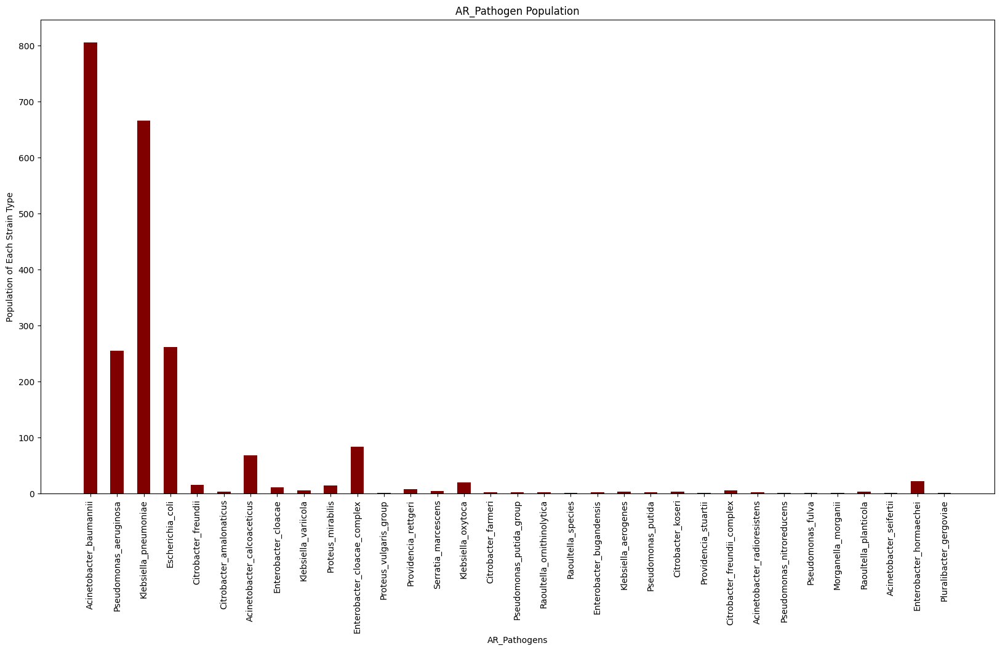

In [37]:
#ploting AR_pop into a bargraph
AR_pathogens = list(AR_pop.keys())
Population = list(AR_pop.values())

#default figure size is 6.4inch  for width and 4.8inch for height.  
#figure(figsize=(WIDTH_SIZE,HEIGHT_SIZE))
fig = plt.figure(figsize = (20, 10))

# creating the bar plot
plt.bar(AR_pathogens, Population , color ='maroon', 
        width = 0.5)

plt.xlabel("AR_Pathogens")
plt.ylabel("Population of Each Strain Type")
plt.xticks(rotation=90)
plt.title("AR_Pathogen Population")
plt.show()

https://www.w3schools.com/python/matplotlib_pie_charts.asp

In [38]:
#possible code to seperate spacing of labels in pie chart? 
#import numpy as np

def fix_labels(mylabels, tooclose=0.1, sepfactor=2):
    vecs = np.zeros((len(mylabels), len(mylabels), 2))
    dists = np.zeros((len(mylabels), len(mylabels)))
    for i in range(0, len(mylabels)-1):
        for j in range(i+1, len(mylabels)):
            a = np.array(mylabels[i].get_position())
            b = np.array(mylabels[j].get_position())
            dists[i,j] = np.linalg.norm(a-b)
            vecs[i,j,:] = a-b
            if dists[i,j] < tooclose:
                mylabels[i].set_x(a[0] + sepfactor*vecs[i,j,0])
                mylabels[i].set_y(a[1] + sepfactor*vecs[i,j,1])
                mylabels[j].set_x(b[0] - sepfactor*vecs[i,j,0])
                mylabels[j].set_y(b[1] - sepfactor*vecs[i,j,1])

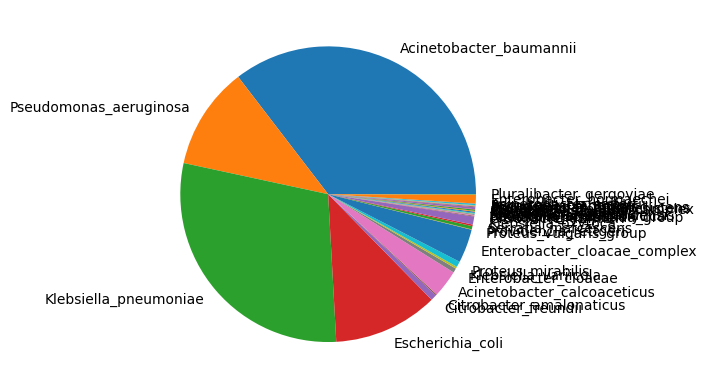

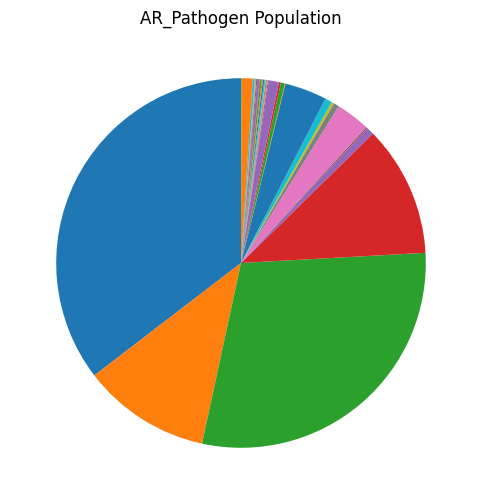

In [41]:
labels = list(AR_pop.keys())
plt.pie(Population, labels = mylabels) 
 
y = Population

# Create a pie chart without labels
plt.figure(figsize=(10, 6))  # Set the figure size (optional)
plt.pie(y, labels = [None] * len(labels), startangle=90)

# Add a title (optional)
plt.title('AR_Pathogen Population')

plt.show() 

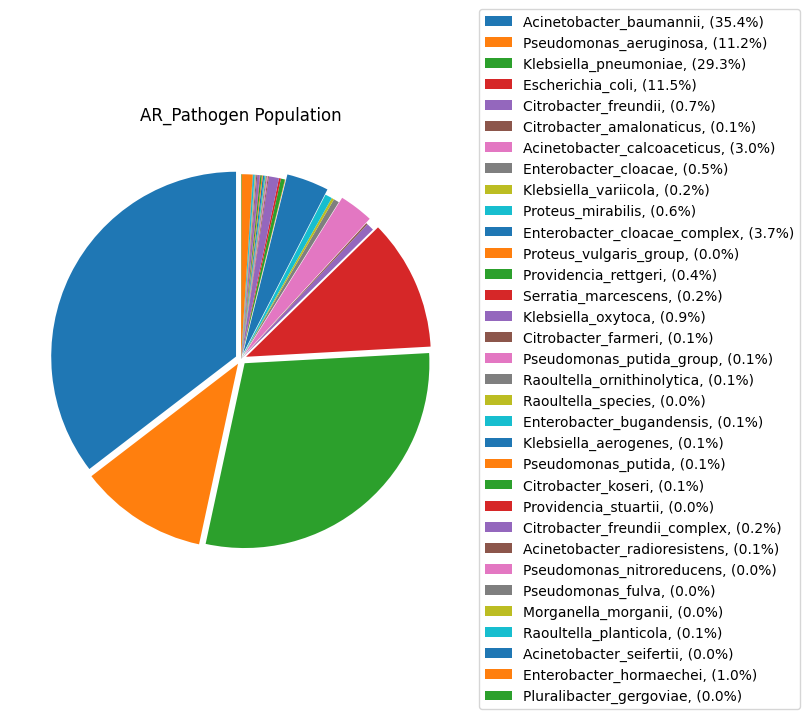

In [42]:
import matplotlib.pyplot as plt

# Assigning the data to variables
labels = list(AR_pop.keys())
y_pops = Population # Sizes or percentages for each category
# Pull out interesting samples
myexplode = [0.03, 0.03, 0.03, 0.03,0,0,0.03,0,0,0,0.03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0, 0, 0]
mycolors = ["B22222",
            "hotpink",
            "b",
            "#4CAF50",
            ]

# Create a pie chart
plt.figure(figsize=(6, 6))  # Set the figure size (optional)
ax = plt.gca()
pie = ax.pie(y, labels=[None] * len(labels), startangle=90,explode = myexplode)




# Calculate the percentages
total = sum(y)
percentages = [( y/ total) * 100 for y in y_pops]

# use a list comprehension to update the labels
labels = [f'{l}, ({percentages:.1f}%)' for l, percentages in zip(labels, percentages)]

# Add a legend outside the pie chart
ax.legend(pie[0], labels, loc='center left', bbox_to_anchor=(1, 0.5))

# Add a title (optional)
plt.title('AR_Pathogen Population')



# Display the chart
plt.show()

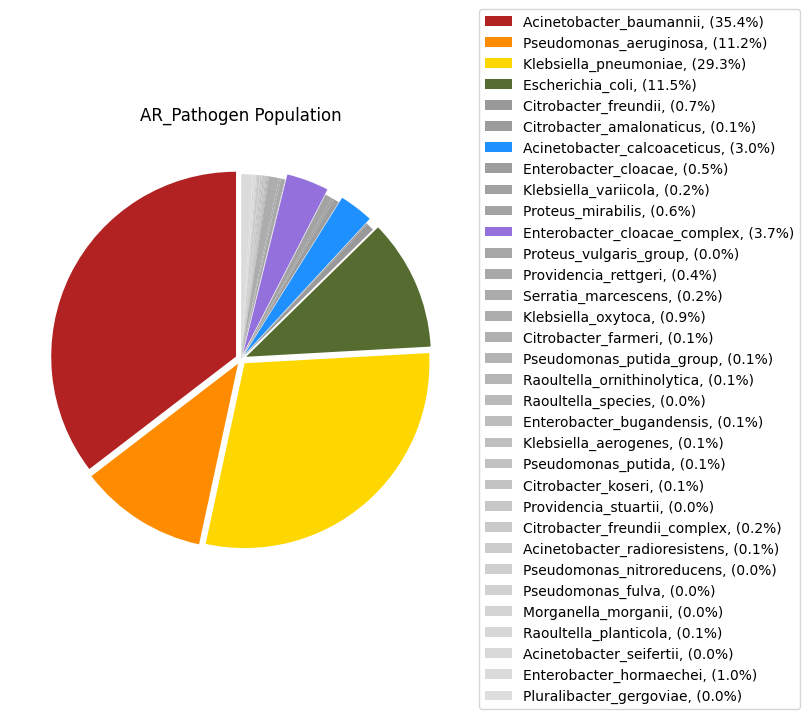

In [43]:
import matplotlib.pyplot as plt

# Assigning the data to variables
labels = list(AR_pop.keys())
y_pops = Population # Sizes or percentages for each category
# Pull out interesting samples
myexplode = [0.03, 0.03, 0.03, 0.03,0,0,0.03,0,0,0,0.03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0, 0, 0]
mycolors = ["#B22222",
            "#FF8C00",
            "#FFD700",
            "#556B2F",
            "#999999",
            '#9C9C9C',
            '#1E90FF',
            '#9E9E9E',
            '#A1A1A1',
            '#A3A3A3',
            '#9370DB',
            '#A6A6A6',
            '#A8A8A8',
            '#ABABAB',
            '#ADADAD',
            '#B0B0B0',
            '#B3B3B3',
            '#B5B5B5',
            '#BABABA',
            '#BDBDBD',
            '#BFBFBF',
            '#C2C2C2',
            '#C4C4C4',
            '#C7C7C7',
            '#C9C9C9',
            '#CCCCCC',
            '#CFCFCF',
            '#D1D1D1',
            '#D4D4D4',
            '#D6D6D6',
            '#D9D9D9',
            '#DBDBDB',
            '#DEDEDE'
            ]

# Create a pie chart
plt.figure(figsize=(6, 6))  # Set the figure size (optional)
ax = plt.gca()
pie = ax.pie(y, labels=[None] * len(labels), startangle=90,explode = myexplode, colors = mycolors)




# Calculate the percentages
total = sum(y)
percentages = [( y/ total) * 100 for y in y_pops]

# use a list comprehension to update the labels
labels = [f'{l}, ({percentages:.1f}%)' for l, percentages in zip(labels, percentages)]

# Add a legend outside the pie chart
ax.legend(pie[0], labels, loc='center left', bbox_to_anchor=(1, 0.5))

# Add a title (optional)
plt.title('AR_Pathogen Population')



# Display the chart
plt.show()

#### **Now we're going to focus on the 5 strains that had over 1.0% the AR_Pathogen Popution.**

Note: Enterobacter_hormaechie is at 1.0% and Klebsiella_oxytoca is 0.9%, which are ones we should really do. 

Maybe these can be further broken down into Klebsiella, Acinetobacter, Pseudomans, and Enterobactor and Citrobacter which are bactiria families rather than bacteria strains. 

### **First step is to subset the data**

We will use Acineobacter_baumanni, Pseudomonas_aeruginosa, Klebsiella_penuomoniae, Escherichia_coli, Acinetobacter_calcoaceticus, and Enterobacter_cloacae_complex. 

In [44]:
Acinetobacter_baumannii

,id,ca_collection_date,Pipeline.Version,css_organism,MLST.Typing.Scheme,ST,Secondary.ST,wgs_id,sra_id,Gene,...,oxa24_40,oxa58,oxa_comb,vim,imp,mcr,imi,sim,spm,ar_gene
0,IDR1700036075-01-00,7/3/17,2.0.0,Acinetobacter baumannii,abaumannii_2,2,195,2023HL-00061,SRR23455315,"ant(3'')-IIa,aph(3'')-Ib,aph(3')-VIa,aph(6)-Id...",...,NaN,NaN,blaOXA-23,NaN,NaN,NaN,NaN,NaN,NaN,blaOXA-23
1,IDR1700046690-01-00,8/31/17,2.0.0,Acinetobacter baumannii,abaumannii_2,49,128,2023HL-00062,SRR23455314,"ant(3'')-IIa,blaADC-117,blaKPC-2,blaOXA-98",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,blaKPC
2,IDR1700049245-01-00,3/24/17,2.0.0,Acinetobacter baumannii,abaumannii_2,2,Unknown,2023HL-00063,SRR23455303,"aac(6')-Ib',aadA1,ant(3'')-IIa,aph(3'')-Ib,aph...",...,NaN,NaN,blaOXA-23,NaN,NaN,NaN,NaN,NaN,NaN,blaOXA-23
3,IDR1800005772-01-00,1/26/18,2.0.0,Acinetobacter baumannii,abaumannii_2,2,208,2018HL-01498,SRR21091498,"ant(3'')-IIa,aph(3'')-Ib,aph(6)-Id,armA,blaADC...",...,NaN,NaN,blaOXA-23,NaN,NaN,NaN,NaN,NaN,NaN,blaOXA-23
4,IDR1800005796-01-00,1/17/18,2.0.0,Acinetobacter baumannii,abaumannii_2,2,1788,2018HL-01499,SRR21091487,"aac(3)-Ia,aadA1,ant(3'')-IIa,aph(3')-VIa,blaAD...",...,NaN,NaN,blaOXA-23,NaN,NaN,NaN,NaN,NaN,NaN,blaOXA-23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
801,IDR2300034055-01-00,6/9/23,2.1.0,Acinetobacter baumannii,abaumannii(Pasteur),2,208,NaN,NaN,"ant(3'')-IIa,aph(3'')-Ib,aph(6)-Id,blaADC-73,b...",...,NaN,NaN,blaOXA-23,NaN,NaN,NaN,NaN,NaN,NaN,blaOXA-23
802,IDR2300034251-01-01,6/14/23,2.1.0,Acinetobacter baumannii,abaumannii(Pasteur),499,345,NaN,NaN,"aac(6')-Ian,ant(2'')-Ia,ant(3'')-IIa,aph(3')-I...",...,NaN,NaN,blaOXA-23,NaN,NaN,NaN,NaN,NaN,NaN,blaOXA-23
803,IDR2300034666-01-00,6/10/23,2.1.0,Acinetobacter baumannii,abaumannii(Pasteur),2,208,NaN,NaN,"ant(3'')-IIa,aph(3'')-Ib,aph(6)-Id,armA,blaADC...",...,NaN,NaN,blaOXA-23,NaN,NaN,NaN,NaN,NaN,NaN,blaOXA-23
804,IDR2300034932-01-00,6/17/23,2.1.0,Acinetobacter baumannii,abaumannii(Pasteur),2,208,NaN,NaN,"ant(3'')-IIa,aph(3'')-Ib,aph(6)-Id,armA,blaADC...",...,NaN,NaN,blaOXA-23,NaN,NaN,NaN,NaN,NaN,NaN,blaOXA-23


In [45]:
print(Acinetobacter_baumannii['Secondary.ST'].unique())

print(len(Acinetobacter_baumannii['Secondary.ST'].unique()))

#print(list(Acinetobacter_baumannii['Secondary.ST']).count('Unknown'))

print(len(list(Acinetobacter_baumannii['Secondary.ST'])))

['195' '128' 'Unknown' '208' '1788' '1739' '345' '281' '348' '1552' '1956'
 '848' '355' '236' '2180' '231' '1617' '520' '2063' '2091' '369' '884'
 '473' '938' '276' '1436' '942' '1052' '949' '234' '1418' '229' '368']
33
806


In [46]:
Acinetobacter_baumannii['ST']

0        2
1       49
2        2
3        2
4        2
      ... 
801      2
802    499
803      2
804      2
805      2
Name: ST, Length: 806, dtype: object

In [47]:
#Lets make a dictionary of the different MLST types and secondary types for each strain

ST = list(Acinetobacter_baumannii['ST'].unique())
Secondary_ST = list(Acinetobacter_baumannii['Secondary.ST'].unique())


In [48]:
Secondary_ST

['195',
 '128',
 'Unknown',
 '208',
 '1788',
 '1739',
 '345',
 '281',
 '348',
 '1552',
 '1956',
 '848',
 '355',
 '236',
 '2180',
 '231',
 '1617',
 '520',
 '2063',
 '2091',
 '369',
 '884',
 '473',
 '938',
 '276',
 '1436',
 '942',
 '1052',
 '949',
 '234',
 '1418',
 '229',
 '368']

In [32]:
type(Acinetobacter_baumannii)

pandas.core.frame.DataFrame

In [33]:
for index, row in Acinetobacter_baumannii.iterrows():
    print(row['ST']) 

2
49
2
2
2
2
2
2
2
2
2
2
2
2
2
2
250
499
2
2
2
2
2
1142
2
2
499
2
2
499
2
2
2
2
2
1142
1142
2
2
2
2
2
2
2
2
2
2
2
2
2
2
1142
2
2
16
15
2
2
2
2
2
2
2
2
2
1142
1142
499
499
2
2
2
499
499
2
2
2
1142
2
2
2
2
2
1142
2
1142
1142
2
499
632
632
2
2
2
2
2
2
2
1142
1142
2
2
2
2
2
499
2
2
2
2
1142
2
499
2
2
2
1142
499
499
1142
2
2
1142
2
2
2
499
Unknown
2
2
250
2
2
2
1142
1142
2
2
2
250
2
2
2
499
499
499
2
2
2
2
16
16
2
2
2
2
2
2
2
2
2
499
499
2
2
2
2
2
2
2
2
2
2
1142
2
2
2
2
2
499
2
2
2
2
499
2
1
1
1142
16
2
2
2
2
2
2
2
32
2
2
2
2
1142
250
2
190
499
1
2
499
2
2
2
499
2
2
499
499
2
1143
499
499
2
2
632
2
1142
2
2
2
499
499
1142
499
499
40
2
2
2
1142
2
2
2
2
2
2
2
2
2
2
2
1142
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
2
499
499
499
16
16
499
2
Unknown
Unknown
2
499
632
2
632
632
632
499
2
1142
632
499
1142
499
2
2
2
2
2
2
499
16
2
2
2
2
1142
1142
499
2
113
2
113
2
2
2
2
2
16
499
2
499
2
499
2
2
499
2
16
16
16
499
16
2
2
499
2
16
Unknown
Unknown
2
2
2
499
2
2
2
2
2
499
499
2
2
499
2
Unknown
2
2

In [105]:
colnames = Acinetobacter_baumannii.columns.values.tolist()
for a in ST:
    df_org = pd.DataFrame()
    #df_org.columns = Acinetobacter_baumannii.columns.values.tolist()
    for index, row in Acinetobacter_baumannii.iterrows():
        if '2' == row['ST']:
            df_org = pd.concat([df_org,pd.DataFrame([row.array])])
    df_org.columns = colnames
for b in Secondary_ST:
     for i in range(len(df_org)):
        if b == df_org.iloc[i,6]:
            print('row number is', i)
            print(df_org.iloc[i,6])
            print('b is', b)


row number is 0
195
b is 195
row number is 87
195
b is 195
row number is 144
195
b is 195
row number is 284
195
b is 195
row number is 356
195
b is 195
row number is 363
195
b is 195
row number is 416
195
b is 195
row number is 473
195
b is 195
row number is 495
195
b is 195
row number is 1
Unknown
b is Unknown
row number is 152
Unknown
b is Unknown
row number is 153
Unknown
b is Unknown
row number is 154
Unknown
b is Unknown
row number is 155
Unknown
b is Unknown
row number is 160
Unknown
b is Unknown
row number is 199
Unknown
b is Unknown
row number is 2
208
b is 208
row number is 4
208
b is 208
row number is 5
208
b is 208
row number is 6
208
b is 208
row number is 8
208
b is 208
row number is 9
208
b is 208
row number is 10
208
b is 208
row number is 12
208
b is 208
row number is 13
208
b is 208
row number is 30
208
b is 208
row number is 31
208
b is 208
row number is 32
208
b is 208
row number is 33
208
b is 208
row number is 34
208
b is 208
row number is 35
208
b is 208
row numbe

In [61]:
lst=list(df_org['Secondary.ST'])
lst.count('1788')
#len(lst)

6

In [127]:
df = pd.read_csv("/Users/tyl17/Documents/AR_combined_dataset_230918.csv")


In [128]:
df = df[['css_organism','ST','Secondary.ST']]

In [129]:
df

,css_organism,ST,Secondary.ST
0,Acinetobacter baumannii,2,195
1,Pseudomonas aeruginosa,111,NaN
2,Acinetobacter baumannii,49,128
3,Acinetobacter baumannii,2,Unknown
4,Klebsiella pneumoniae,1399,NaN
...,...,...,...
2271,Escherichia coli,361,650
2272,Klebsiella pneumoniae,4843,NaN
2273,Klebsiella pneumoniae,4843,NaN
2274,Klebsiella pneumoniae,4843,NaN


In [ ]:
df = df.groupby(['css_organism','ST','Secondary.ST']).size().reset_index()

In [130]:
df['css_organism'].unique()

array(['Acinetobacter baumannii', 'Pseudomonas aeruginosa',
       'Klebsiella pneumoniae', 'Escherichia coli',
       'Citrobacter freundii', 'Citrobacter amalonaticus',
       'Acinetobacter calcoaceticus', 'Enterobacter cloacae',
       'Klebsiella variicola', 'Proteus mirabilis',
       'Enterobacter cloacae complex', 'Proteus vulgaris group',
       'Providencia rettgeri', 'Serratia marcescens',
       'Klebsiella oxytoca', 'Citrobacter farmeri',
       'Pseudomonas putida group', 'Raoultella ornithinolytica',
       'Raoultella species', 'Enterobacter bugandensis',
       'Klebsiella aerogenes', 'Pseudomonas putida', 'Citrobacter koseri',
       'Providencia stuartii', 'Citrobacter freundii complex',
       'Acinetobacter radioresistens', 'Pseudomonas nitroreducens',
       'Pseudomonas fulva', 'Morganella morganii',
       'Raoultella planticola', 'Acinetobacter seifertii',
       'Enterobacter hormaechei', 'Pluralibacter gergoviae'], dtype=object)

In [112]:
df = pd.pivot_table(df, index=['css_organism'], columns=['ST', 'Secondary.ST'])

In [113]:
df

0                                                   \
ST                         1           10               101    1112 1125  113   
Secondary.ST             231 Unknown    2  346 Unknown   88 Unknown  302  884   
css_organism                                                                    
Acinetobacter baumannii  2.0     1.0  NaN  NaN     NaN  NaN     1.0  NaN  3.0   
Escherichia coli         NaN     NaN  2.0  1.0     2.0  1.0     NaN  1.0  NaN   

                               ...                                         \
ST                       1142  ...  752    8346  866     877  940           
Secondary.ST             1552  ...  367 Unknown 1436 Unknown  866 Unknown   
css_organism                   ...                                          
Acinetobacter baumannii  61.0  ...  NaN     NaN  6.0     NaN  NaN     NaN   
Escherichia coli          NaN  ...  1.0     3.0  NaN     1.0  1.0     1.0   

                                                   
ST                      Unknown                    
Secondary.ST                  2   43   87 Unknown  
css_organism                                       
Acinetobacter baumannii     NaN  NaN  NaN     7.0  
Escherichia coli            2.0  1.0  1.0     4.0  

[2 rows x 117 columns]

In [122]:
df.iloc[5].reset_index()

IndexError: single positional indexer is out-of-bounds

In [117]:
df = df.iloc[0].reset_index()

In [160]:
import matplotlib.pyplot as plt
import matplotlib as mpl
import pandas as pd
mpl.use('TkAgg')

In [49]:
df = Acinetobacter_baumannii.groupby(['css_organism','ST','Secondary.ST']).size().reset_index()
df = pd.pivot_table(df, index=['css_organism'], columns=['ST', 'Secondary.ST'])

In [50]:
print(df)

                           0                                                  \
ST                         1            1112  113  1142         1143           
Secondary.ST             231 Unknown Unknown  884  1552 Unknown  949 Unknown   
css_organism                                                                   
Acinetobacter baumannii  2.0     1.0     1.0  3.0  61.0     1.0  2.0     2.0   

                                    ...                                        \
ST                        15    16  ...  267      32   40   49    499           
Secondary.ST             236   355  ...  942 Unknown  520  128    345 Unknown   
css_organism                        ...                                         
Acinetobacter baumannii  2.0  44.0  ...  2.0     1.0  1.0  1.0  113.0     4.0   

                                                 
ST                       632        866 Unknown  
Secondary.ST             208   281 1436 Unknown  
css_organism                               

In [51]:
df.iloc[0].reset_index()

,level_0,ST,Secondary.ST,Acinetobacter baumannii
0,0,1,231,2.0
1,0,1,Unknown,1.0
2,0,1112,Unknown,1.0
3,0,113,884,3.0
4,0,1142,1552,61.0
5,0,1142,Unknown,1.0
6,0,1143,949,2.0
7,0,1143,Unknown,2.0
8,0,15,236,2.0
9,0,16,355,44.0


In [52]:
df = df.iloc[0].reset_index()
del df['level_0']

In [53]:
#create pivot table again of just Croydon
df = df.pivot_table('Acinetobacter baumannii', ['ST', 'Secondary.ST'])
df

Acinetobacter baumannii
ST      Secondary.ST                         
1       231                               2.0
        Unknown                           1.0
1112    Unknown                           1.0
113     884                               3.0
1142    1552                             61.0
        Unknown                           1.0
1143    949                               2.0
        Unknown                           2.0
15      236                               2.0
16      355                              44.0
164     1418                              2.0
        234                               1.0
187     Unknown                           2.0
190     1617                              1.0
2       1052                              1.0
        1788                              6.0
        195                               9.0
        1956                              1.0
        2063                              2.0
        208                             338.0
        2091                              1.0
        2180                              4.0
        281                              79.0
        348                              11.0
        368                               1.0
        369                               4.0
        473                              13.0
        848                              38.0
        938                               2.0
        Unknown                           7.0
25      229                               1.0
        276                               2.0
250     1739                              3.0
        Unknown                           1.0
267     942                               2.0
32      Unknown                           1.0
40      520                               1.0
49      128                               1.0
499     345                             113.0
        Unknown                           4.0
632     208                               7.0
        281                              15.0
866     1436                              6.0
Unknown Unknown                           7.0

In [54]:
#This is a whitish blue color code 
facecolor = '#eaeaf2'
#this is a grey color code
font_color = '#525252'
#I liked this font. Don't know why! 
hfont = {'fontname':'Osaka'}
#these labels are the type of major crime categories. 
labels = ['2',
 '49',
 '250',
 '499',
 '1142',
 '16',
 '15',
 '632',
 'Unknown',
 '1',
 '32',
 '190',
 '1143',
 '40',
 '113',
 '25',
 '866',
 '267',
 '164',
 '187',
 '1112']
#what is this size? 
size = 0.3
vals = df['Acinetobacter baumannii']
# Major category values = sum of minor category values
group_sum = df.groupby('ST')['Acinetobacter baumannii'].sum()

In [168]:
ST

['2',
 '49',
 '250',
 '499',
 '1142',
 '16',
 '15',
 '632',
 'Unknown',
 '1',
 '32',
 '190',
 '1143',
 '40',
 '113',
 '25',
 '866',
 '267',
 '164',
 '187',
 '1112']

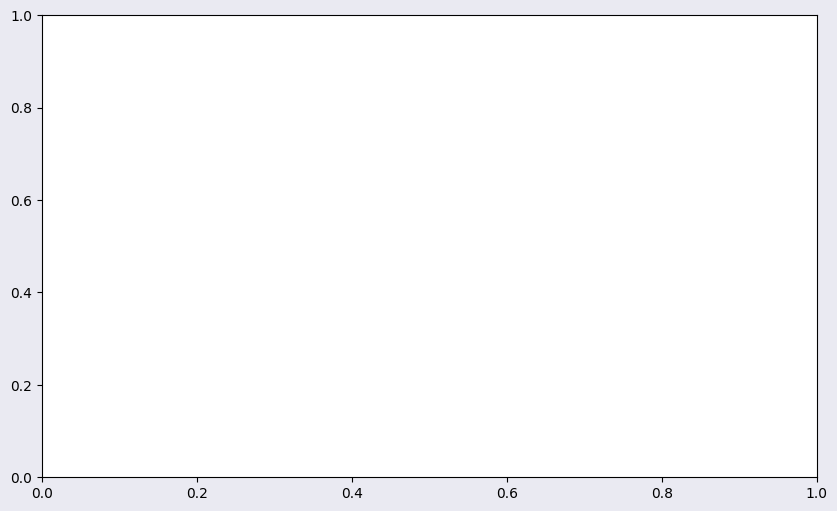

In [55]:
#Create a figure and subplots
#figsize=(10,6) creates a 1000 × 600 px figure.
fig, ax = plt.subplots(figsize=(10,6), facecolor=facecolor)

In [56]:
#Create Colors
a,b,c,d,e,f,g,h,i = [plt.cm.winter, plt.cm.cool, plt.cm.spring, plt.cm.copper, plt.cm.bone, plt.cm.gist_heat, plt.cm.pink, plt.cm.summer, plt.cm.autumn]

outer_colors = [a(.6), b(.6), c(.6), d(.6), e(.6), f(.6), g(.6), h(.6), i(.6)]
inner_colors = [a(.5), a(.4), 
                b(.5), b(.4), b(.3), b(.2),
                c(.5), c(.4), c(.3),
                d(.5), d(.4),
                e(.5), e(.4),
                f(.5), f(.4),
                g(.5), g(.4),
                h(.7), h(.6), h(.5), h(.4), h(.3), h(.2), h(.1), h(5),
                i(.7), i(.6), i(.5), i(.4), i(.3), i(.2), i(.1)]
    
#Here, 9 variables from a to i correspond to the number of the outer circle’s sections (which are major categories of crime). 
#plt.cm.winter, plt.cm.cool, etc. are Matplotlib colormaps. You can read about them in Matplotlib documentation.
#a(.6), b(.5), c(.4), etc. correspond to color variants or opacity levels.
#The number of a to i variables inside inner_colors corresponds to the number of the inner circle’s sections inside each of the outer circle’s sections

In [173]:
width=size

In [174]:
edgecolor='w'

In [57]:
#Draw pies

ax.pie(group_sum, 
       radius=1, 
       colors=outer_colors, 
       labels=labels, 
       textprops={'color':font_color},
       wedgeprops= dict(width=size, edgecolor='w'))

ax.pie(vals, 
       radius=1-size, # size=0.3
       colors=inner_colors,
       wedgeprops= dict(width=size, edgecolor='w'))

TypeError: 'dict' object is not callable

In [179]:
dict(width=size, edgecolor='w')

TypeError: 'dict' object is not callable

In [181]:
dict(name = "John", age = 36, country = "Norway")

TypeError: 'dict' object is not callable

In [58]:
globals()

{'__name__': '__main__',
 '__doc__': 'Automatically created module for IPython interactive environment',
 '__package__': None,
 '__loader__': None,
 '__spec__': None,
 '__builtin__': <module 'builtins' (built-in)>,
 '__builtins__': <module 'builtins' (built-in)>,
 '_ih': ['',
  'Org_Set ',
  'import pandas as pd\nimport numpy\nimport re\nimport matplotlib.pyplot as plt ',
  'df = pd.read_csv("/Users/tyl17/Documents/AR_combined_dataset_230918.csv")\n#print(df.head())\nlist(df.columns)',
  'css_unique = df.css_organism.unique()\nprint(css_unique)\nlen(css_unique)',
  "#This for loop turns seperates out each organism into their each individual dataframe saved under the variable name of the organism\n#Example: all rows with organism Acinetobacter baumannii are saved as a dataframe in a variable Acinetobacter_baumannii\ndf2= pd.DataFrame()\nFreq = []\nfor i in css_unique:\n    df2= pd.DataFrame(dict[i])\n    df2.columns = list(df.columns)\n     #print(df2.head())\n    variable_name = re.sub

In [67]:
d = dir()
print(d)

for obj in d:
    #checking for built-in variables/functions
    if not obj.startswith('__'):
        #deleting the said obj, since a user-defined function
        del globals()[obj]

['Acinetobacter_radioresistens', 'Acinetobacter_seifertii', 'Citrobacter_amalonaticus', 'Citrobacter_farmeri', 'Citrobacter_freundii', 'Citrobacter_freundii_complex', 'Citrobacter_koseri', 'Enterobacter_bugandensis', 'Enterobacter_cloacae', 'Enterobacter_cloacae_complex', 'Enterobacter_hormaechei', 'Escherichia_coli', 'Freq', 'In', 'Klebsiella_aerogenes', 'Klebsiella_oxytoca', 'Klebsiella_pneumoniae', 'Klebsiella_variicola', 'Morganella_morganii', 'Org_Set', 'Out', 'Pluralibacter_gergoviae', 'Population', 'Proteus_mirabilis', 'Proteus_vulgaris_group', 'Providencia_rettgeri', 'Providencia_stuartii', 'Pseudomonas_aeruginosa', 'Pseudomonas_fulva', 'Pseudomonas_nitroreducens', 'Pseudomonas_putida', 'Pseudomonas_putida_group', 'Raoultella_ornithinolytica', 'Raoultella_planticola', 'Raoultella_species', 'ST', 'Secondary_ST', 'Serratia_marcescens', '_', '_13', '_18', '_19', '_22', '_23', '_24', '_25', '_26', '_27', '_28', '_3', '_30', '_32', '_34', '_35', '_36', '_4', '_44', '_46', '_48', '_5

In [68]:
d = dir()
print(d)

['__', '___', '__builtin__', '__builtins__', '__doc__', '__loader__', '__name__', '__package__', '__spec__', '__vsc_ipynb_file__', '_i', '_i68', '_ii', '_iii', 'obj']


In [65]:
del Acinetobacter_calcoaceticus